In [52]:
import preprocess
import visualize
import selection
import relevance
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn import tree
from genetic_selection import GeneticSelectionCV
from xgboost import XGBClassifier
from imblearn.over_sampling import SMOTE
import lime
import lime.lime_tabular
import shap
from lime import submodular_pick
from eli5 import show_weights, show_prediction
from eli5.sklearn import explain_weights_sklearn, explain_decision_tree

import warnings
warnings.filterwarnings("ignore")

In [2]:
# load data for personal internet use disorder
data = preprocess.load_piu_data()
data.head()

,Gender,Achievement,Economic status,Internet Use (in years),Internet Use (hours per week),Internet Use (hours per day),Internet Use (in holiday),Attitude about time on the Internet,Politics,Business,...,Coffee,Alcohol,Drepressive temperament,Cyclothymic temperament,Hyperthymic temperament,Irritable temperament,Anxiety temperament,PIU,PIUcutoff,Cutoff_Class
0,0.0,3.0,3.0,9.0,1.0,1.0,2.0,0.0,5.0,1.0,...,1.0,1.0,0.857143,0.571429,0.500,0.571429,0.714286,NaN,NaN,NaN
1,0.0,4.0,4.0,5.0,0.0,0.0,2.0,0.0,2.0,1.0,...,0.0,0.0,0.285714,0.857143,0.875,0.571429,0.571429,25.0,0.0,0.0
2,0.0,4.0,3.0,9.0,1.0,1.0,1.0,0.0,2.0,3.0,...,0.0,0.0,0.142857,0.142857,1.000,0.142857,0.000000,28.0,0.0,0.0
3,0.0,4.0,3.0,7.0,0.0,0.0,1.0,0.0,1.0,2.0,...,0.0,0.0,0.285714,0.142857,1.000,0.714286,0.428571,31.0,0.0,0.0
4,0.0,4.0,1.0,2.0,0.0,0.0,2.0,0.0,1.0,3.0,...,NaN,0.0,0.428571,0.428571,0.625,0.857143,0.714286,28.0,0.0,0.0


In [3]:
# print column names to check if everything is OK
print(data.columns)

Index(['Gender', 'Achievement', 'Economic status', 'Internet Use (in years)',
       'Internet Use (hours per week)', 'Internet Use (hours per day)',
       'Internet Use (in holiday)', 'Attitude about time on the Internet',
       'Politics', 'Business', 'Sports', 'Computers and technology',
       'Arts and culture', 'Education', 'Pop culture', 'Pornography', 'Music',
       'Travel/tourism', 'Health and medicine', 'Science', 'Religion',
       'Communication by e-mail', 'Social networks',
       'Communication on the forum', 'Communication on the blog',
       'Targeted Internet search', 'Surfing', 'Expert Advice',
       'Search for favorite websites', 'Reading the news', 'Online games',
       'Reading and downloading books and texts',
       'Downloading music and movies', 'Internet for school', 'Online courses',
       'Everyday FB use', 'Average time spent on FB', 'FB use - reading posts',
       'FB use - publishing statuses', 'FB use - sharing music, photos etc.',
       'FB 

In [4]:
# check columns with NaN values
print(data.isna().sum().sort_values(ascending=False))

Cutoff_Class                               104
PIUcutoff                                  104
PIU                                        104
Average time spent on FB                    95
Internet Use (in years)                     91
Sports – in minutes                         86
Internet Use (hours per day)                72
Communication by e-mail                     60
Communication on the blog                   59
Sports – intensity                          55
Online games                                54
Online courses                              54
Pornography                                 53
Communication on the forum                  52
Expert Advice                               49
Reading and downloading books and texts     48
Fast Food                                   46
Religion                                    45
Travel/tourism                              43
Pop culture                                 43
Business                                    43
Computers and

In [5]:
data = preprocess.process_standardization(data)
data.head

<bound method NDFrame.head of       Gender  Achievement  Economic status  Internet Use (in years)  \
0        0.0     0.333333             0.50                 0.750000   
1        0.0     0.666667             0.75                 0.416667   
2        0.0     0.666667             0.50                 0.750000   
3        0.0     0.666667             0.50                 0.583333   
4        0.0     0.666667             0.00                 0.166667   
...      ...          ...              ...                      ...   
2108     0.0     0.666667             0.00                 0.166667   
2109     0.0     1.000000             0.50                 0.416667   
2110     0.0     0.333333             0.50                 0.416667   
2111     0.0     0.666667             0.00                 0.250000   
2112     0.0     0.333333             0.75                 0.250000   

      Internet Use (hours per week)  Internet Use (hours per day)  \
0                               1.0             

In [6]:
data = preprocess.process_columns_with_nan_values(data)
# check again columns with NaN values
print(data.isna().sum().sort_values(ascending=False))

Gender                                     0
Sports – intensity                         0
Internet for school                        0
Online courses                             0
Everyday FB use                            0
Average time spent on FB                   0
FB use - reading posts                     0
FB use - publishing statuses               0
FB use - sharing music, photos etc.        0
FB use –gaming                             0
FB use – chatting                          0
FB use – visiting groups                   0
Sports – days in a  week                   0
Sports – in minutes                        0
Online games                               0
Energy drinks                              0
Fast Food                                  0
Smoker                                     0
Coffee                                     0
Alcohol                                    0
Drepressive temperament                    0
Cyclothymic temperament                    0
Hyperthymi

In [7]:
data = preprocess.process_outliers(data)

Original number of rows: 2009
Number of normal rows detected: 1908
Number of outliers detected: 101
Number of rows after eliminating outliers: 1908


In [8]:
# predictors and class
x_data = data[data.columns.difference(['Cutoff_Class', 'PIUcutoff', 'PIU' ])]
y_data = data['Cutoff_Class']
# split dataset to training and test sets
x_train, x_test, y_train, y_test = train_test_split(x_data, y_data, test_size=0.05, random_state=1234, stratify=y_data, shuffle=True)
x_train = x_train.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)
x_test = x_test.reset_index(drop=True)
y_test = y_test.reset_index(drop=True)

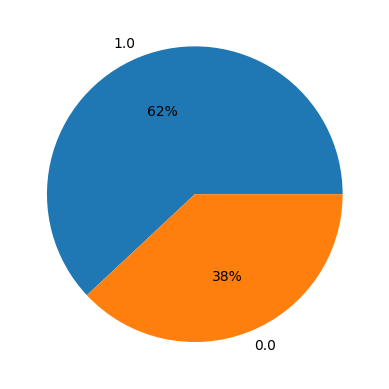

In [9]:
df = pd.DataFrame({'Cutoff_Class':y_train})
visualize.show_value_distribution_per_column(df, 'Cutoff_Class')

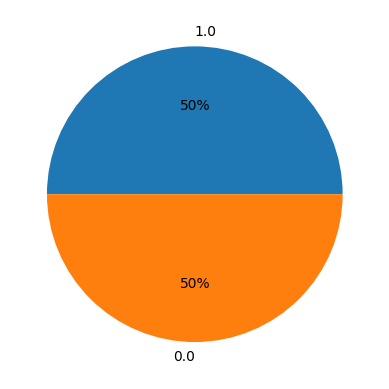

In [10]:
# oversample data
oversampler = SMOTE()
x_train, y_train = oversampler.fit_resample(x_train, y_train)
df = pd.DataFrame({'Cutoff_Class':y_train})
visualize.show_value_distribution_per_column(df, 'Cutoff_Class')

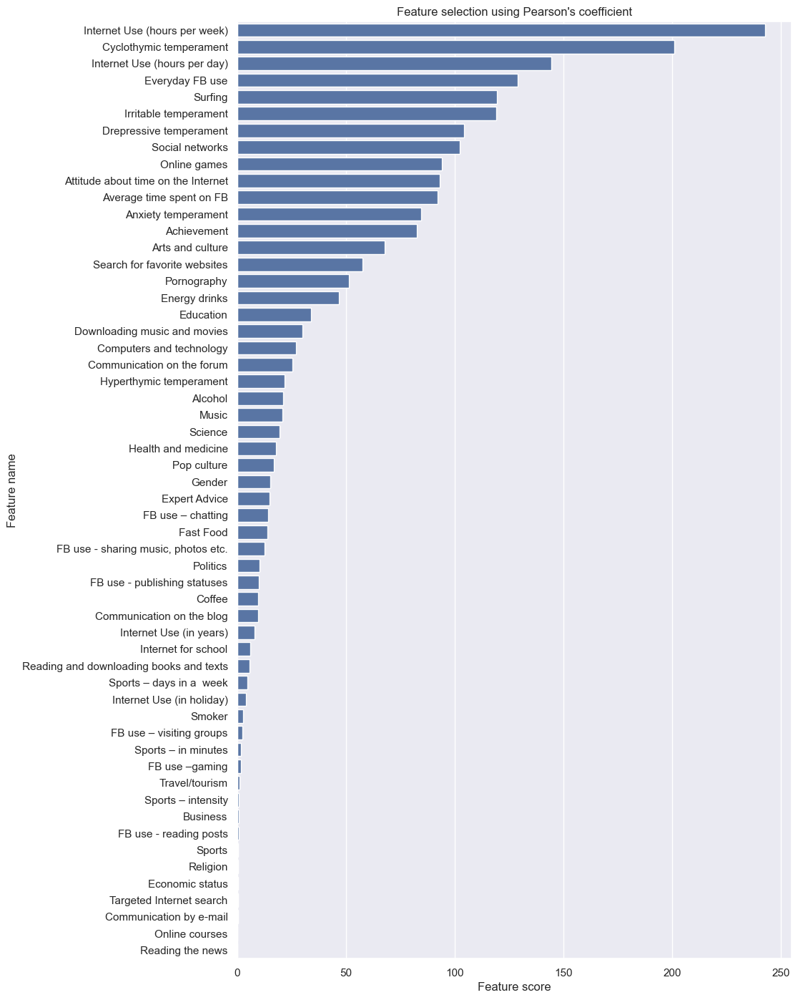

In [11]:
k_features = selection.select_k_best_features(x_train, y_train, 0)
visualize.show_selected_features(
    title = 'Feature selection using Pearson\'s coefficient',
    label_x = 'Feature score',
    label_y = 'Feature name',
    data_x = k_features['score'],
    data_y = k_features['feature']
)

In [12]:
trained_models = dict()
parameters = dict()
# hyperparameters for decision tree classifier
parameters['decision_tree'] = dict(
    max_leaf_nodes = list(range(2,10)), 
    min_samples_split = [2,3,4],
    max_depth = [2,3,5,10],
    criterion = ['gini', 'entropy']
)
trained_models['decision_tree'] = DecisionTreeClassifier()

# hyperparameters for random forest classifier
parameters['random_forest'] = dict(
    n_estimators = [10,20,40], 
    criterion = ['gini', 'entropy', 'log_loss'],
    # max_features = list(range(3,8)),
    max_depth = [2,4,9]
)
trained_models['random_forest'] = RandomForestClassifier()

# hyperparameters for adaboost classifier
parameters['adaboost'] = dict(
    n_estimators = [10,20,40],
    learning_rate = [0.01,0.1,1],
    algorithm = ['SAMME', 'SAMME.R']
)
trained_models['adaboost'] = AdaBoostClassifier()

# hyperparameters for xgboost classifier
parameters['xgboost'] = dict(
    max_depth = [1,3,5,7,9,11],
    learning_rate = [0.01,0.1,1,10,100],
    subsample = [0.5, 0.7, 1],
    n_estimators = [5,50,70]
)
trained_models['xgboost'] = XGBClassifier()

#hyperparameters for bagging classifier
parameters['bagging'] = dict(
    #n_estimators = [300, 400, 500, 600, 700, 800],
    n_estimators = [300, 600],
    # max_features = [0.90, 0.92, 0.95, 1.0],
    bootstrap = [True, False],
    bootstrap_features = [True, False],
)
trained_models['bagging'] = BaggingClassifier()

# hyperparameters for gradient boosting classifier
parameters['gradient_boosting'] = dict(
    n_estimators = [5,50,70],
    max_depth = [1,3,5,7,9,11],
    learning_rate = [0.01,0.1,1,10,100],
    #loss = ['log_loss', 'exponential'],
    #criterion = ['friedman_mse', 'squared_error']
)
trained_models['gradient_boosting'] = GradientBoostingClassifier()

# train classifier using GridSearchCV for each of the selected models
# print("Not optimizing parameters every time")
# uncomment only to recheck hyperparameter optimization
# for m in trained_models:
#     trained_models[m] = selection.train_best_classifier(m, trained_models[m], parameters[m], x_train, y_train, x_test, y_test)

# instead create models with optimized parameters
trained_models = dict()
trained_models['decision_tree'] = DecisionTreeClassifier(criterion='entropy', max_depth=5, max_leaf_nodes=7)
trained_models['random_forest'] = RandomForestClassifier(criterion='entropy', max_depth=9, n_estimators=40)
trained_models['adaboost'] = AdaBoostClassifier(learning_rate=1, n_estimators=40)
trained_models['xgboost'] = XGBClassifier(max_depth=9, learning_rate=0.1, n_estimators=50)
#trained_models['bagging'] = BaggingClassifier(bootstrap_features=False, bootstrap=True, n_estimators=600)
#trained_models['gradient_boost'] = GradientBoostingClassifier(learning_rate=1, max_depth=11, n_estimators=70)

In [13]:
# compute classification metrics for every classification model
df_models = selection.calculate_classifier_metrics(trained_models, x_train, y_train)
print(df_models)

      Model name  Accuracy  Precision  Recall     F1
0  decision_tree     0.706      0.722   0.674  0.695
1  random_forest     0.801      0.816   0.777  0.796
2       adaboost     0.769      0.765   0.777  0.770
3        xgboost     0.795      0.793   0.798  0.795


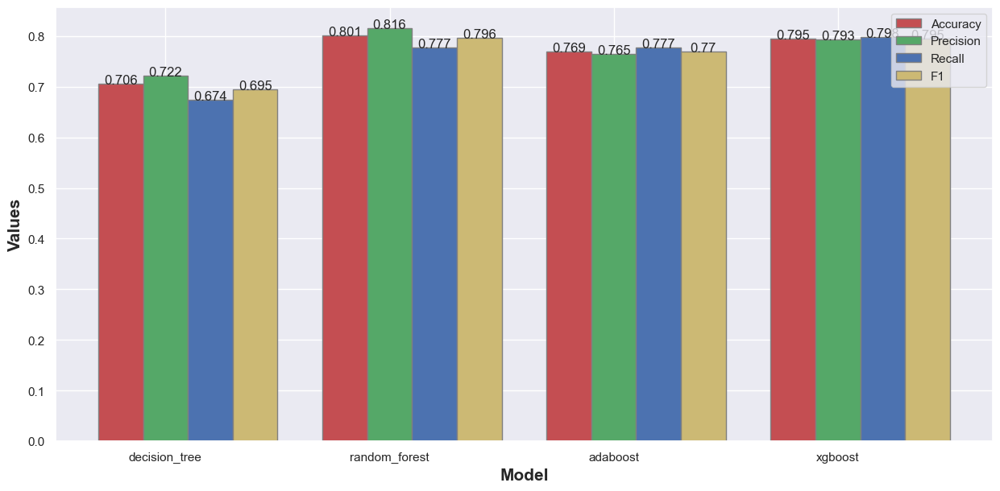

In [14]:
# show metrics for trained models
visualize.show_model_comparasion(df_models)

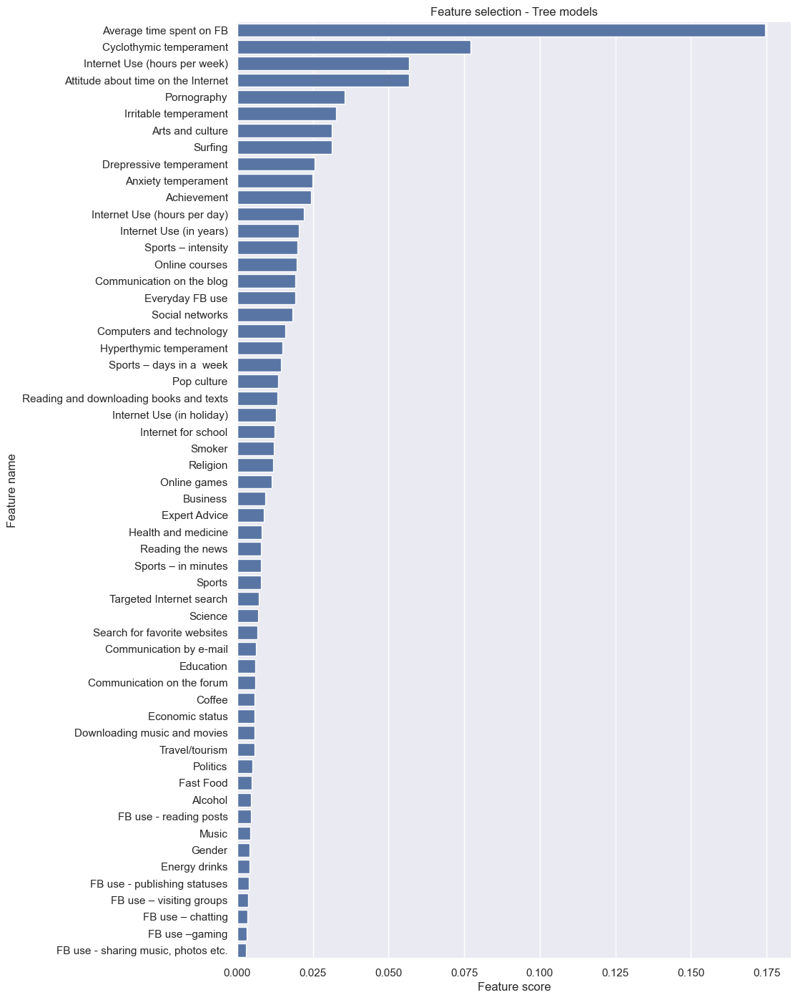

In [15]:
# fit all models with train data
for m in trained_models:
    trained_models[m] = trained_models[m].fit(x_train, y_train)
    
df_features = selection.get_feature_importances(trained_models, x_train, y_train)
visualize.show_selected_features(
    title = 'Feature selection - Tree models',
    label_x = 'Feature score',
    label_y = 'Feature name',
    data_x = df_features['values'],
    data_y = df_features['attr_names']
)


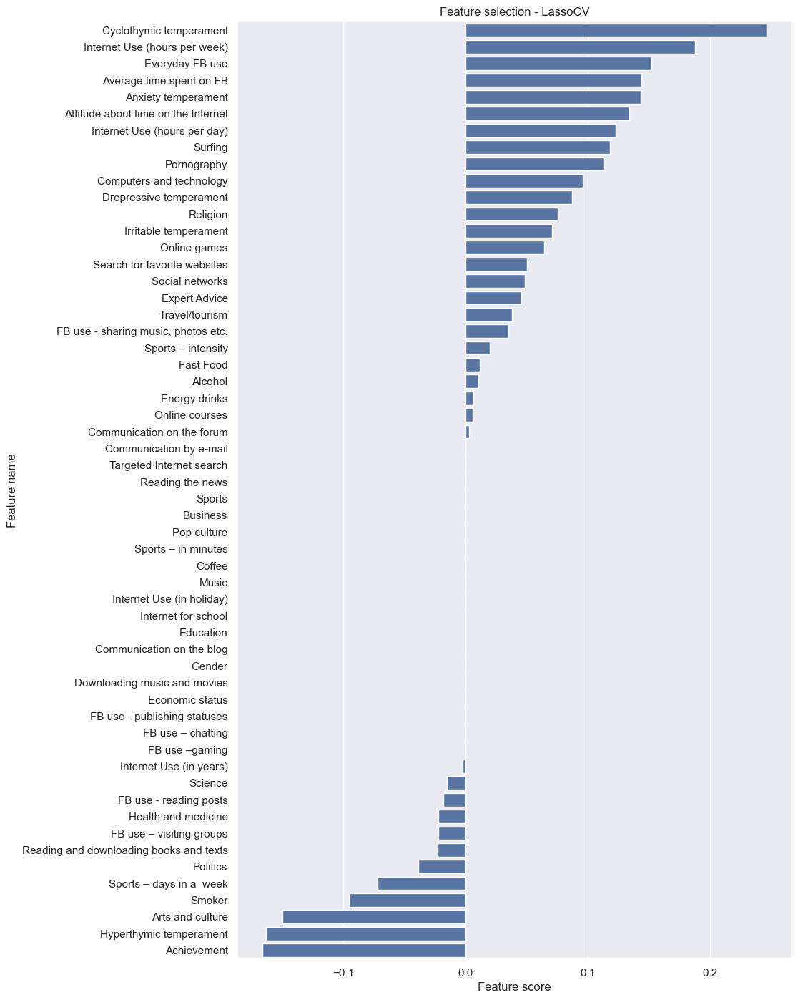

In [16]:
# show features selected by LassoCV
df_features = selection.get_feature_scores_lasso(x_train, y_train)
visualize.show_selected_features(
    title = 'Feature selection - LassoCV',
    label_x = 'Feature score',
    label_y = 'Feature name',
    data_x = df_features['values'],
    data_y = df_features['attr_names']
)


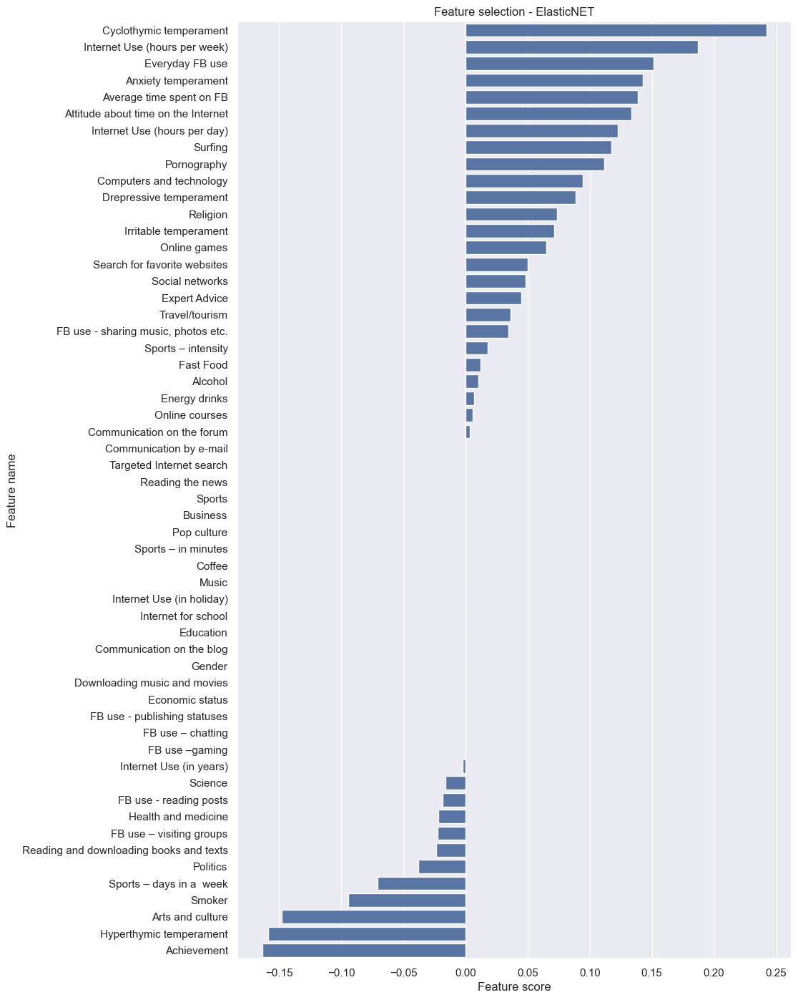

In [17]:
# show features selected by ElasticNET
df_features = selection.get_feature_scores_elenet(x_train, y_train)
visualize.show_selected_features(
    title = 'Feature selection - ElasticNET',
    label_x = 'Feature score',
    label_y = 'Feature name',
    data_x = df_features['values'],
    data_y = df_features['attr_names']
)


In [18]:
# feature selection using genetic algorithms
selector = GeneticSelectionCV(
    estimator=trained_models['random_forest'],
    cv=10,
    scoring="accuracy",
    n_population=20, #50,
    n_generations=5, #40,
    n_jobs=10,
    verbose=False
)
selector.fit(x_train, y_train)
visualize.show_genetic_selection_results(selector, x_train)

                                   features  is_used
0                               Achievement     True
1                                   Alcohol     True
2                       Anxiety temperament     True
3                          Arts and culture     True
4       Attitude about time on the Internet     True
5                  Average time spent on FB     True
6                                  Business     True
7                                    Coffee     True
8                   Communication by e-mail     True
9                 Communication on the blog     True
10               Communication on the forum     True
11                 Computers and technology     True
12                  Cyclothymic temperament     True
13             Downloading music and movies     True
14                  Drepressive temperament     True
15                          Economic status     True
16                                Education     True
17                            Energy drinks   

True positive predictions.

Expected PIU value: 1.0.

Predicted PIU value: 1.



True negative predictions.

Expected PIU value: 0.0.

Predicted PIU value: 0.



False positive predictions.

Expected PIU value: 0.0.

Predicted PIU value: 1.



False negative predictions.

Expected PIU value: 1.0.

Predicted PIU value: 0.



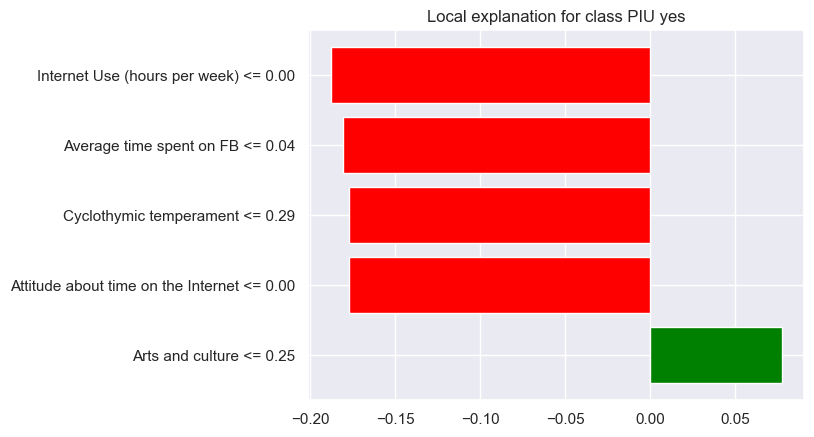

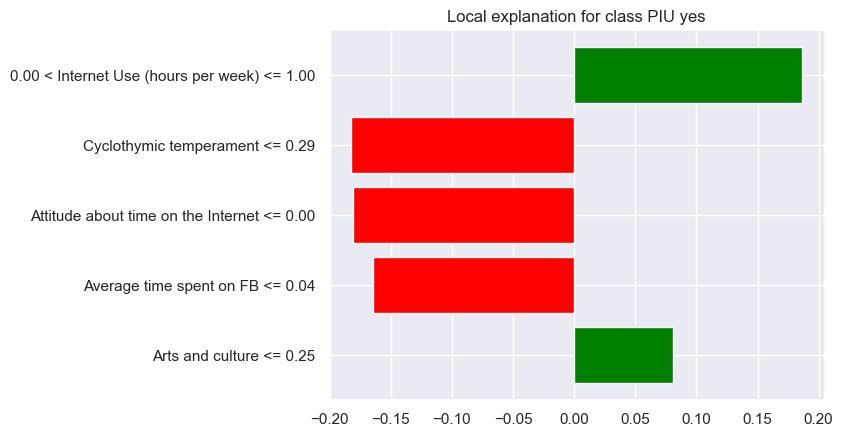

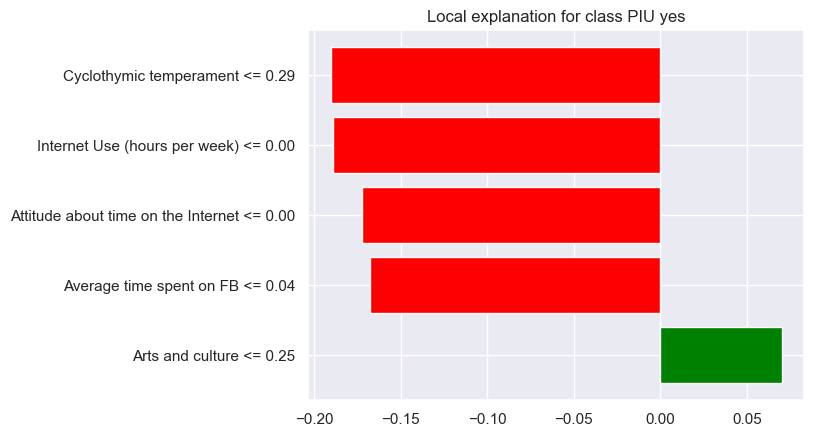

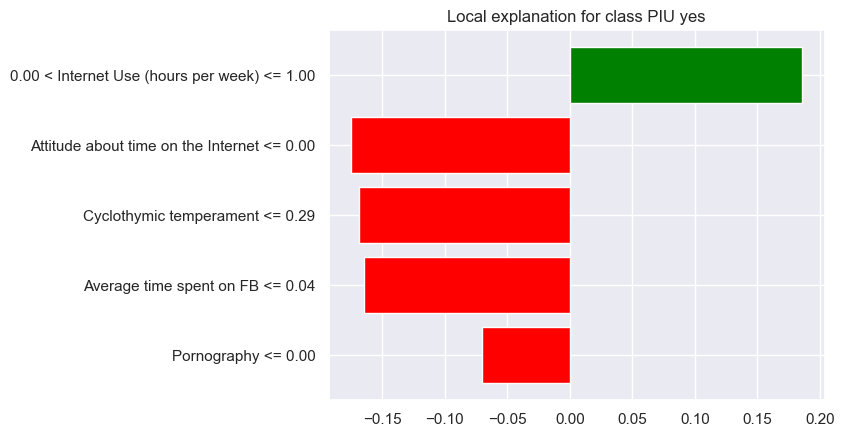

In [21]:
# use LIME to explain results for a single prediction
explainer = lime.lime_tabular.LimeTabularExplainer(
    x_test.values, 
    feature_names=x_test.columns.values.tolist(),
    class_names=['PIU no', 'PIU yes'], 
    verbose=False, 
    mode='classification'
)
predictions = relevance.get_predictions(trained_models['xgboost'], x_test, y_test)
predict_fn = lambda x: trained_models['xgboost'].predict_proba(x)

print('True positive predictions.\n')
i = predictions['tp'][0][0]
print('Expected PIU value: {}.\n'.format(y_test[i]))
print('Predicted PIU value: {}.\n'.format(predictions['predicted_values']['Predicted'][i]))
exp = explainer.explain_instance(
    x_test.loc[i, x_test.columns.values.tolist()].astype(int).values, 
    predict_fn, 
    num_features=5
)
exp.show_in_notebook(show_table=True)
figure = exp.as_pyplot_figure(label = exp.available_labels()[0])

print('True negative predictions.\n')
i = predictions['tn'][0][0]
print('Expected PIU value: {}.\n'.format(y_test[i]))
print('Predicted PIU value: {}.\n'.format(predictions['predicted_values']['Predicted'][i]))
exp = explainer.explain_instance(
    x_test.loc[i, x_test.columns.values.tolist()].astype(int).values, 
    predict_fn, 
    num_features=5
)
exp.show_in_notebook(show_table=True)
figure = exp.as_pyplot_figure(label = exp.available_labels()[0])

print('False positive predictions.\n')
i = predictions['fp'][0][0]
print('Expected PIU value: {}.\n'.format(y_test[i]))
print('Predicted PIU value: {}.\n'.format(predictions['predicted_values']['Predicted'][i]))
exp = explainer.explain_instance(
    x_test.loc[i, x_test.columns.values.tolist()].astype(int).values, 
    predict_fn, 
    num_features=5
)
exp.show_in_notebook(show_table=True)
figure = exp.as_pyplot_figure(label = exp.available_labels()[0])

print('False negative predictions.\n')
i = predictions['fn'][0][0]
print('Expected PIU value: {}.\n'.format(y_test[i]))
print('Predicted PIU value: {}.\n'.format(predictions['predicted_values']['Predicted'][i]))
exp = explainer.explain_instance(
    x_test.loc[i, x_test.columns.values.tolist()].astype(int).values, 
    predict_fn, 
    num_features=5
)
exp.show_in_notebook(show_table=True)
figure = exp.as_pyplot_figure(label = exp.available_labels()[0])

SP-LIME Explanations.
SP-LIME Local Explanations


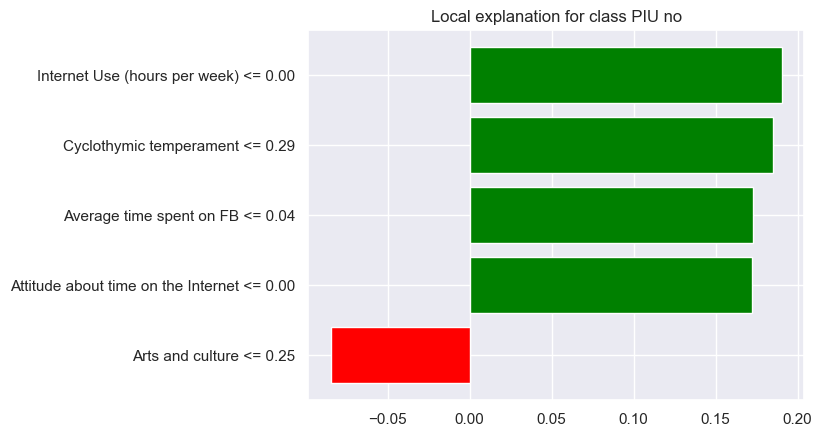

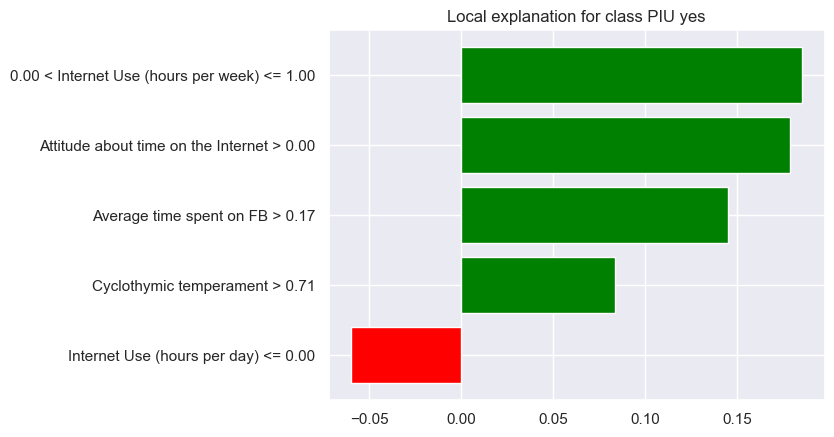

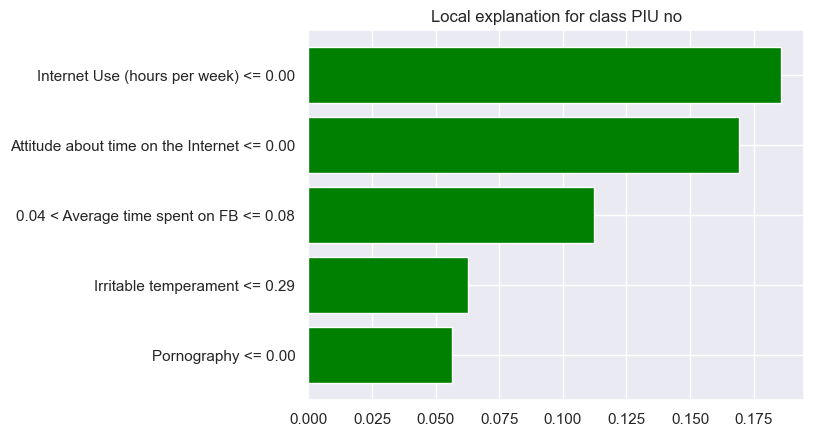

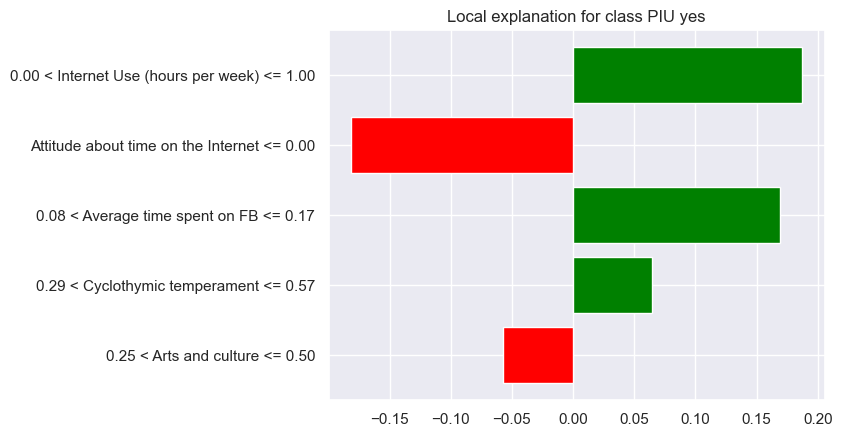

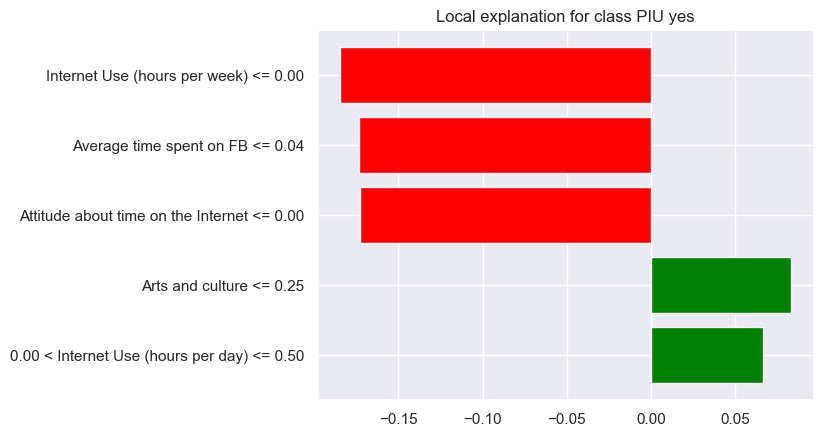

In [22]:
# Let's use SP-LIME to return explanations on a sample data set 
# and obtain a non-redundant global decision perspective of the black-box model
sp_exp = submodular_pick.SubmodularPick(explainer, 
                                        x_test[x_test.columns.values.tolist()].values,
                                        predict_fn, 
                                        num_features=5,
                                        num_exps_desired=5
                                       )
[exp.show_in_notebook() for exp in sp_exp.sp_explanations]
print('SP-LIME Explanations.')
[exp.as_pyplot_figure(label=exp.available_labels()[0]) for exp in sp_exp.sp_explanations]
print('SP-LIME Local Explanations')

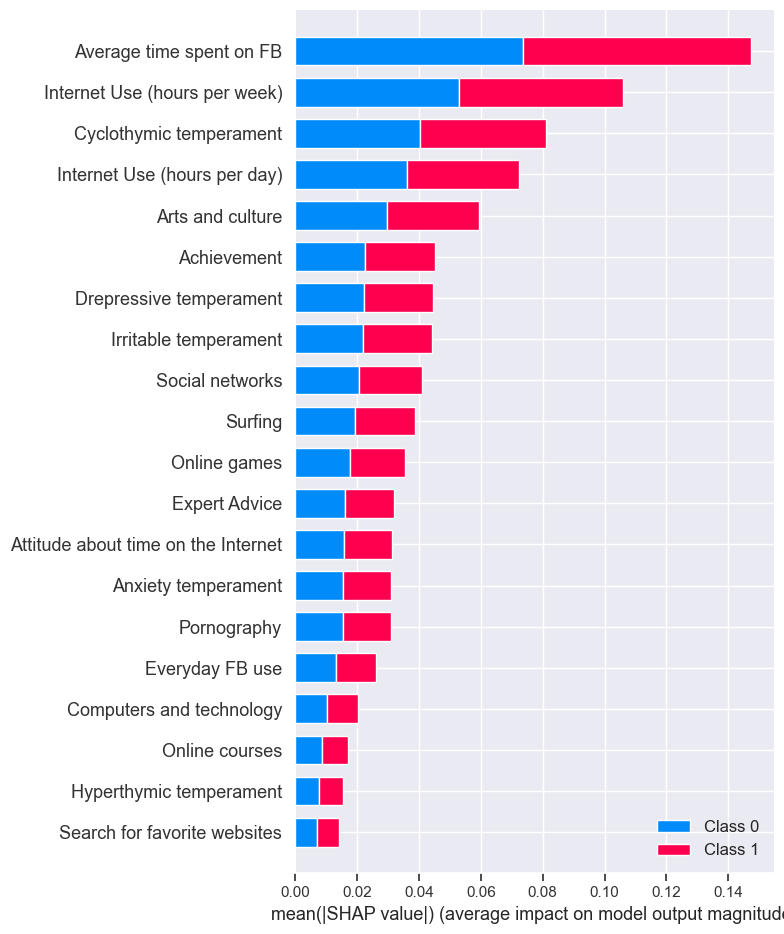

In [31]:
# creating SHAP explainer
explainer = shap.TreeExplainer(trained_models['xgboost'])
shap_values = explainer.shap_values(x_train)
# show summary plot of global features relevance 
shap.initjs()
shap.summary_plot(shap_values, x_train)

In [34]:
# plot explanations for single instance predictions
predictions = relevance.get_predictions(trained_models['xgboost'], x_test, y_test)

print('True positive predictions.\n')
i = predictions['tp'][0][0]
print('Expected PIU value: {}.\n'.format(y_test[i]))
print('Predicted PIU value: {}.\n'.format(predictions['predicted_values']['Predicted'][i]))

shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1][0,:], x_train.iloc[i,:])

True positive predictions.

Expected PIU value: 1.0.

Predicted PIU value: 1.



True negative predictions.

Expected PIU value: 1.0.

Predicted PIU value: 1.



In [35]:
print('True negative predictions.\n')
i = predictions['tn'][0][0]
print('Expected PIU value: {}.\n'.format(y_test[i]))
print('Predicted PIU value: {}.\n'.format(predictions['predicted_values']['Predicted'][i]))

shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[0][0,:], x_train.iloc[i,:])

True negative predictions.

Expected PIU value: 0.0.

Predicted PIU value: 0.



In [39]:
print('False positive predictions.\n')
i = predictions['fp'][0][0]
print('Expected PIU value: {}.\n'.format(y_test[i]))
print('Predicted PIU value: {}.\n'.format(predictions['predicted_values']['Predicted'][i]))

shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1][0,:], x_train.iloc[i,:])

False positive predictions.

Expected PIU value: 0.0.

Predicted PIU value: 1.



In [46]:
print('False negative predictions.\n')
i = predictions['fn'][0][0]
print('Expected PIU value: {}.\n'.format(y_test[i]))
print('Predicted PIU value: {}.\n'.format(predictions['predicted_values']['Predicted'][i]))

shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[0][0,:], x_train.iloc[i,:])

False negative predictions.

Expected PIU value: 1.0.

Predicted PIU value: 0.



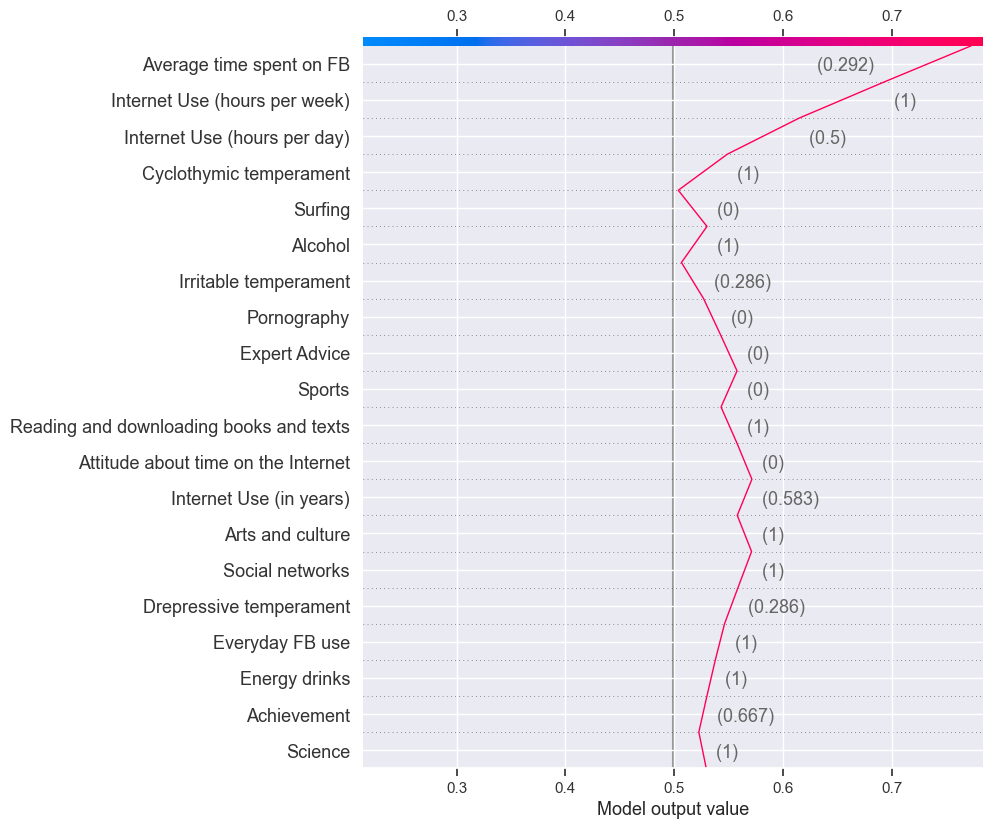

In [48]:
shap.initjs()
shap.decision_plot(explainer.expected_value[1], shap_values[1][0,:], x_train.iloc[0,:])

In [50]:
# use eli5 (permutation feature importance) to show global feature relevance
show_weights(
    trained_models['xgboost'], 
    targets=[0, 1], 
    target_names=['PIU no', 'PIU yes'],
    feature_names=x_train.columns.values.tolist(),
    top=len(x_train.columns)+1
)

Weight,Feature
0.0685,Average time spent on FB
0.0601,Internet Use (hours per week)
0.0527,Attitude about time on the Internet
0.0348,Everyday FB use
0.0341,Cyclothymic temperament
0.0271,Internet Use (hours per day)
0.0249,Pornography
0.0239,Business
0.0231,Social networks
0.0207,Irritable temperament


In [55]:
# plot explanations for single instance predictions
predictions = relevance.get_predictions(trained_models['xgboost'], x_test, y_test)

print('True positive predictions.\n')
i = predictions['tp'][0][0]
print('Expected PIU value: {}.\n'.format(y_test[i]))
print('Predicted PIU value: {}.\n'.format(predictions['predicted_values']['Predicted'][i]))

show_prediction(
    trained_models['xgboost'],
    x_train.iloc[i,:],
    targets=[0, 1], 
    target_names=['PIU no', 'PIU yes'],
    feature_names=x_train.columns.values.tolist(),
    top=len(x_train.columns)+1
)

True positive predictions.

Expected PIU value: 1.0.

Predicted PIU value: 1.

True negative predictions.

Expected PIU value: 0.0.

Predicted PIU value: 0.



In [56]:
print('True negative predictions.\n')
i = predictions['tn'][0][0]
print('Expected PIU value: {}.\n'.format(y_test[i]))
print('Predicted PIU value: {}.\n'.format(predictions['predicted_values']['Predicted'][i]))

show_prediction(
    trained_models['xgboost'],
    x_train.iloc[i,:],
    targets=[0, 1], 
    target_names=['PIU no', 'PIU yes'],
    feature_names=x_train.columns.values.tolist(),
    top=len(x_train.columns)+1
)

True negative predictions.

Expected PIU value: 0.0.

Predicted PIU value: 0.



In [57]:
print('False positive predictions.\n')
i = predictions['fp'][0][0]
print('Expected PIU value: {}.\n'.format(y_test[i]))
print('Predicted PIU value: {}.\n'.format(predictions['predicted_values']['Predicted'][i]))

show_prediction(
    trained_models['xgboost'],
    x_train.iloc[i,:],
    targets=[0, 1], 
    target_names=['PIU no', 'PIU yes'],
    feature_names=x_train.columns.values.tolist(),
    top=len(x_train.columns)+1
)

True negative predictions.

Expected PIU value: 0.0.

Predicted PIU value: 1.



In [58]:
print('False negative predictions.\n')
i = predictions['fn'][0][0]
print('Expected PIU value: {}.\n'.format(y_test[i]))
print('Predicted PIU value: {}.\n'.format(predictions['predicted_values']['Predicted'][i]))

show_prediction(
    trained_models['xgboost'],
    x_train.iloc[i,:],
    targets=[0, 1], 
    target_names=['PIU no', 'PIU yes'],
    feature_names=x_train.columns.values.tolist(),
    top=len(x_train.columns)+1
)

False negative predictions.

Expected PIU value: 1.0.

Predicted PIU value: 0.

